## split dataset

In [ ]:
import os
import shutil
from pathlib import Path
import numpy as np

def read_yolo_label(label_path):
    """Read YOLO label file and return class indices."""
    with open(label_path, 'r') as f:
        lines = f.readlines()
    class_indices = set()
    for line in lines:
        if line.strip():
            class_idx = int(line.split()[0])
            class_indices.add(class_idx)
    return class_indices

def separate_classes(base_dir, split_type):
    """Separate images and labels by class for a given split (train/val)."""
    images_dir = Path(base_dir) / split_type / 'images'
    labels_dir = Path(base_dir) / split_type / 'labels'
    
    # Create dictionary to store class information
    class_files = {}
    
    # Process each label file
    for label_file in labels_dir.glob('*.txt'):
        image_name = label_file.stem
        image_file = images_dir / f"{image_name}.jpg"  # Assuming jpg format, modify if needed
        
        # Skip if image doesn't exist
        if not image_file.exists():
            print(f"Warning: No matching image for {label_file}")
            continue
            
        # Get class indices from label file
        class_indices = read_yolo_label(label_file)
        
        # Add files to corresponding classes
        for class_idx in class_indices:
            if class_idx not in class_files:
                class_files[class_idx] = []
            class_files[class_idx].append((image_file, label_file))
    
    # Create directories and copy files
    for class_idx in class_files:
        # Create class directories
        class_dir = Path(base_dir) / split_type / f'class{class_idx}'
        class_images_dir = class_dir / 'images'
        class_labels_dir = class_dir / 'labels'
        
        os.makedirs(class_images_dir, exist_ok=True)
        os.makedirs(class_labels_dir, exist_ok=True)
        
        # Copy files
        for image_file, label_file in class_files[class_idx]:
            shutil.copy2(image_file, class_images_dir / image_file.name)
            shutil.copy2(label_file, class_labels_dir / label_file.name)
            
        print(f"{split_type}/class{class_idx}: {len(class_files[class_idx])} files")

def main():
    base_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER'  # Change this to your dataset path
    
    # Process both train and val splits
    for split_type in ['train', 'val']:
        print(f"\nProcessing {split_type} split:")
        separate_classes(base_dir, split_type)

if __name__ == "__main__":
    main()

## Data Count for Train Dataset

In [ ]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER/train' 

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Training Dataset", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


## Data Count for Val Dataset

In [ ]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER/val' 

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Validation Dataset", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


# Generate Zoom-out for train

In [7]:
import os
import random
from PIL import Image
from collections import defaultdict

def apply_zoom_out(image_path, label_path, zoom_out_factor, output_image_path, output_label_path):
    """
    Apply zoom out augmentation to an image and its labels by adding white borders
    
    Args:
    - image_path: Path to the input image
    - label_path: Path to the input label file
    - zoom_out_factor: Factor by which to zoom out (< 1)
    - output_image_path: Path to save the zoomed out image
    - output_label_path: Path to save the zoomed out labels
    """
    # Load the image
    original_image = Image.open(image_path)
    img_width, img_height = original_image.size

    # Calculate new image dimensions
    new_width = int(img_width / zoom_out_factor)
    new_height = int(img_height / zoom_out_factor)

    # Create a new white background image
    zoomed_out_image = Image.new('RGB', (new_width, new_height), color='white')

    # Calculate positioning to center the original image
    left = (new_width - img_width) // 2
    top = (new_height - img_height) // 2

    # Paste the original image onto the white background
    zoomed_out_image.paste(original_image, (left, top))

    # Adjust bounding box labels
    zoomed_labels = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])

            # Convert normalized coordinates to pixel coordinates of original image
            px_x_center = x_center * img_width
            px_y_center = y_center * img_height
            px_width = width * img_width
            px_height = height * img_height

            # Adjust pixel coordinates to new white background image
            new_px_x_center = px_x_center + left
            new_px_y_center = px_y_center + top

            # Convert back to normalized coordinates of the new image
            new_x_center = new_px_x_center / new_width
            new_y_center = new_px_y_center / new_height
            new_width = px_width / new_width
            new_height = px_height / new_height

            # Strictly enforce valid normalized coordinates
            new_x_center = max(0, min(1, new_x_center))
            new_y_center = max(0, min(1, new_y_center))
            new_width = max(0, min(1, new_width))
            new_height = max(0, min(1, new_height))

            # Ensure the entire bounding box is within image bounds
            if (new_x_center - new_width/2 >= 0 and 
                new_x_center + new_width/2 <= 1 and 
                new_y_center - new_height/2 >= 0 and 
                new_y_center + new_height/2 <= 1):
                # Add the modified label
                zoomed_labels.append(f"{class_id} {new_x_center:.6f} {new_y_center:.6f} {new_width:.6f} {new_height:.6f}")

    # Only save if we have valid labels
    if zoomed_labels:
        # Resize the zoomed out image back to original size (optional, can be removed if you want variable size)
        zoomed_out_image = zoomed_out_image.resize((img_width, img_height), Image.LANCZOS)
        
        # Save the zoomed out image and labels
        zoomed_out_image.save(output_image_path)
        with open(output_label_path, 'w') as f:
            f.writelines('\n'.join(zoomed_labels) + '\n')
        return True
    return False

def balance_dataset(base_path, target_count=175):
    """Generate 175 zoom-out augmentations per class"""
    # Available zoom out factors with more fine-grained progression
    zoom_out_factors = [round(0.88 - x * 0.04, 2) for x in range(7)]  # [0.88, 0.84, 0.80, 0.76, 0.72, 0.68, 0.64]
    
    # Define the output directory for augmented data
    output_base_path = "dsout/train"
    os.makedirs(output_base_path, exist_ok=True)

    # Process each class directory
    class_dirs = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d)) and d.startswith('class')]
    
    for class_dir in class_dirs:
        class_path = os.path.join(base_path, class_dir)
        images_dir = os.path.join(class_path, 'images')
        labels_dir = os.path.join(class_path, 'labels')
        
        # Ensure directories exist
        os.makedirs(images_dir, exist_ok=True)
        os.makedirs(labels_dir, exist_ok=True)
        
        # Get list of original images (without zoom annotations)
        original_images = [f for f in os.listdir(images_dir) 
                         if f.endswith(('.jpg', '.jpeg', '.png')) and '(z' not in f]
        
        print(f"\nProcessing {class_dir}:")
        print(f"Original images: {len(original_images)}")
        
        # Ensure at least 175 images are generated per class
        print(f"Generating {target_count} augmented images...")
        
        # Keep track of used zoom out factors for each image
        used_zoom_factors = defaultdict(set)
        
        augmentations_created = 0
        attempts = 0
        max_attempts = target_count * 20  # Increased attempts to account for potential rejections
        
        while augmentations_created < target_count and attempts < max_attempts:
            attempts += 1
            
            # Get a random original image
            image_file = random.choice(original_images)
            
            # Get available zoom out factors for this image
            available_factors = [f for f in zoom_out_factors 
                               if f not in used_zoom_factors[image_file]]
            
            if not available_factors:
                continue  # Skip if no available zoom out factors for this image
                
            # Choose random zoom out factor from available ones
            zoom_out_factor = random.choice(available_factors)
            used_zoom_factors[image_file].add(zoom_out_factor)
            
            # Setup paths for output in the new directory
            label_file = os.path.splitext(image_file)[0] + '.txt'
            image_path = os.path.join(images_dir, image_file)
            label_path = os.path.join(labels_dir, label_file)
            
            # Verify label file exists
            if not os.path.exists(label_path):
                print(f"Warning: Label file not found for {image_file}")
                continue
            
            # Create output filenames with zoom out factor
            base_name = os.path.splitext(image_file)[0]
            ext = os.path.splitext(image_file)[1]
            new_image_name = f"{base_name}(z{zoom_out_factor}){ext}"
            new_label_name = f"{base_name}(z{zoom_out_factor}).txt"
            
            output_image_path = os.path.join(output_base_path, class_dir, 'images', new_image_name)
            output_label_path = os.path.join(output_base_path, class_dir, 'labels', new_label_name)
            
            # Ensure the output directories exist
            os.makedirs(os.path.dirname(output_image_path), exist_ok=True)
            os.makedirs(os.path.dirname(output_label_path), exist_ok=True)
            
            # Apply zoom out augmentation
            if apply_zoom_out(image_path, label_path, zoom_out_factor, output_image_path, output_label_path):
                augmentations_created += 1
                if augmentations_created % 10 == 0:
                    print(f"Generated {augmentations_created}/{target_count} augmented images")
            
        # Print statistics
        print(f"\nCompleted augmentation for {class_dir}")
        print(f"Total augmented images created: {augmentations_created}")
        print("\nZoom out factors used per image:")
        for img, factors in used_zoom_factors.items():
            if factors:
                print(f"  {img}: {sorted(factors)}")

if __name__ == "__main__":
    # Path to your dataset directory containing class0, class1, etc.
    dataset_path = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\train'   # Adjust this to your dataset path
    
    print("Starting Generating balancing...")
    balance_dataset(dataset_path)
    print("\nDataset Generating completed!")


Starting Generating balancing...

Processing class0:
Original images: 362
Generating 175 augmented images...
Generated 10/175 augmented images
Generated 20/175 augmented images
Generated 30/175 augmented images
Generated 40/175 augmented images
Generated 50/175 augmented images
Generated 60/175 augmented images
Generated 70/175 augmented images
Generated 80/175 augmented images
Generated 90/175 augmented images
Generated 100/175 augmented images
Generated 110/175 augmented images
Generated 120/175 augmented images
Generated 130/175 augmented images
Generated 140/175 augmented images
Generated 150/175 augmented images
Generated 160/175 augmented images
Generated 170/175 augmented images

Completed augmentation for class0
Total augmented images created: 175

Zoom out factors used per image:
  white_bg_Balete-C-61-_jpg.rf.5006e96da6fce8d4f92ddc7fcf21b6fa.jpg: [0.88]
  env_Balete-O-41-_JPG.rf.e51a7f10ee8a74198c6f78fc4f05df5f.jpg: [0.84]
  env_Balete-B-28-_jpg.rf.6ea8f7156d8a3780308c8ab89e5

## Generate Random Zoom Outs for Val

In [8]:
import os
import random
from PIL import Image
from collections import defaultdict

def apply_zoom_out(image_path, label_path, zoom_out_factor, output_image_path, output_label_path):
    """
    Apply zoom out augmentation to an image and its labels by adding white borders
    
    Args:
    - image_path: Path to the input image
    - label_path: Path to the input label file
    - zoom_out_factor: Factor by which to zoom out (< 1)
    - output_image_path: Path to save the zoomed out image
    - output_label_path: Path to save the zoomed out labels
    """
    # Load the image
    original_image = Image.open(image_path)
    img_width, img_height = original_image.size

    # Calculate new image dimensions
    new_width = int(img_width / zoom_out_factor)
    new_height = int(img_height / zoom_out_factor)

    # Create a new white background image
    zoomed_out_image = Image.new('RGB', (new_width, new_height), color='white')

    # Calculate positioning to center the original image
    left = (new_width - img_width) // 2
    top = (new_height - img_height) // 2

    # Paste the original image onto the white background
    zoomed_out_image.paste(original_image, (left, top))

    # Adjust bounding box labels
    zoomed_labels = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])

            # Convert normalized coordinates to pixel coordinates of original image
            px_x_center = x_center * img_width
            px_y_center = y_center * img_height
            px_width = width * img_width
            px_height = height * img_height

            # Adjust pixel coordinates to new white background image
            new_px_x_center = px_x_center + left
            new_px_y_center = px_y_center + top

            # Convert back to normalized coordinates of the new image
            new_x_center = new_px_x_center / new_width
            new_y_center = new_px_y_center / new_height
            new_width = px_width / new_width
            new_height = px_height / new_height

            # Strictly enforce valid normalized coordinates
            new_x_center = max(0, min(1, new_x_center))
            new_y_center = max(0, min(1, new_y_center))
            new_width = max(0, min(1, new_width))
            new_height = max(0, min(1, new_height))

            # Ensure the entire bounding box is within image bounds
            if (new_x_center - new_width/2 >= 0 and 
                new_x_center + new_width/2 <= 1 and 
                new_y_center - new_height/2 >= 0 and 
                new_y_center + new_height/2 <= 1):
                # Add the modified label
                zoomed_labels.append(f"{class_id} {new_x_center:.6f} {new_y_center:.6f} {new_width:.6f} {new_height:.6f}")

    # Only save if we have valid labels
    if zoomed_labels:
        # Resize the zoomed out image back to original size (optional, can be removed if you want variable size)
        zoomed_out_image = zoomed_out_image.resize((img_width, img_height), Image.LANCZOS)
        
        # Save the zoomed out image and labels
        zoomed_out_image.save(output_image_path)
        with open(output_label_path, 'w') as f:
            f.writelines('\n'.join(zoomed_labels) + '\n')
        return True
    return False

def balance_dataset(base_path, target_count=50):
    """Generate 175 zoom-out augmentations per class"""
    # Available zoom out factors with more fine-grained progression
    zoom_out_factors = [round(0.88 - x * 0.04, 2) for x in range(7)]  # [0.88, 0.84, 0.80, 0.76, 0.72, 0.68, 0.64]
    
    # Define the output directory for augmented data
    output_base_path = "dsout/val"
    os.makedirs(output_base_path, exist_ok=True)

    # Process each class directory
    class_dirs = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d)) and d.startswith('class')]
    
    for class_dir in class_dirs:
        class_path = os.path.join(base_path, class_dir)
        images_dir = os.path.join(class_path, 'images')
        labels_dir = os.path.join(class_path, 'labels')
        
        # Ensure directories exist
        os.makedirs(images_dir, exist_ok=True)
        os.makedirs(labels_dir, exist_ok=True)
        
        # Get list of original images (without zoom annotations)
        original_images = [f for f in os.listdir(images_dir) 
                         if f.endswith(('.jpg', '.jpeg', '.png')) and '(z' not in f]
        
        print(f"\nProcessing {class_dir}:")
        print(f"Original images: {len(original_images)}")
        
        # Ensure at least 175 images are generated per class
        print(f"Generating {target_count} augmented images...")
        
        # Keep track of used zoom out factors for each image
        used_zoom_factors = defaultdict(set)
        
        augmentations_created = 0
        attempts = 0
        max_attempts = target_count * 20  # Increased attempts to account for potential rejections
        
        while augmentations_created < target_count and attempts < max_attempts:
            attempts += 1
            
            # Get a random original image
            image_file = random.choice(original_images)
            
            # Get available zoom out factors for this image
            available_factors = [f for f in zoom_out_factors 
                               if f not in used_zoom_factors[image_file]]
            
            if not available_factors:
                continue  # Skip if no available zoom out factors for this image
                
            # Choose random zoom out factor from available ones
            zoom_out_factor = random.choice(available_factors)
            used_zoom_factors[image_file].add(zoom_out_factor)
            
            # Setup paths for output in the new directory
            label_file = os.path.splitext(image_file)[0] + '.txt'
            image_path = os.path.join(images_dir, image_file)
            label_path = os.path.join(labels_dir, label_file)
            
            # Verify label file exists
            if not os.path.exists(label_path):
                print(f"Warning: Label file not found for {image_file}")
                continue
            
            # Create output filenames with zoom out factor
            base_name = os.path.splitext(image_file)[0]
            ext = os.path.splitext(image_file)[1]
            new_image_name = f"{base_name}(z{zoom_out_factor}){ext}"
            new_label_name = f"{base_name}(z{zoom_out_factor}).txt"
            
            output_image_path = os.path.join(output_base_path, class_dir, 'images', new_image_name)
            output_label_path = os.path.join(output_base_path, class_dir, 'labels', new_label_name)
            
            # Ensure the output directories exist
            os.makedirs(os.path.dirname(output_image_path), exist_ok=True)
            os.makedirs(os.path.dirname(output_label_path), exist_ok=True)
            
            # Apply zoom out augmentation
            if apply_zoom_out(image_path, label_path, zoom_out_factor, output_image_path, output_label_path):
                augmentations_created += 1
                if augmentations_created % 10 == 0:
                    print(f"Generated {augmentations_created}/{target_count} augmented images")
            
        # Print statistics
        print(f"\nCompleted augmentation for {class_dir}")
        print(f"Total augmented images created: {augmentations_created}")
        print("\nZoom out factors used per image:")
        for img, factors in used_zoom_factors.items():
            if factors:
                print(f"  {img}: {sorted(factors)}")

if __name__ == "__main__":
    # Path to your dataset directory containing class0, class1, etc.
    dataset_path = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\val'   # Adjust this to your dataset path
    
    print("Starting Generating balancing...")
    balance_dataset(dataset_path)
    print("\nDataset Generating completed!")


Starting Generating balancing...

Processing class0:
Original images: 92
Generating 50 augmented images...
Generated 10/50 augmented images
Generated 20/50 augmented images
Generated 30/50 augmented images
Generated 40/50 augmented images
Generated 50/50 augmented images

Completed augmentation for class0
Total augmented images created: 50

Zoom out factors used per image:
  env_Balete-B-15-_jpg.rf.afdbc2f3a972a8f732746208b37d8ecc.jpg: [0.68]
  env_Balete-S-11-_jpg.rf.0b55c1c9c6caef204d195bba8939535e.jpg: [0.68]
  env_Balete-L-19-_jpg.rf.66a8815a8bef8517c056f0c039397465.jpg: [0.68]
  env_Balete-DD-16-_jpg.rf.ff113121666f97f2eed257be7c0d93c5_aug_270_50.jpg: [0.84]
  env_Balete-B-9-_jpg.rf.71c7e80ddc4e105b49659b7e04df0903_aug_90_24.jpg: [0.72, 0.8]
  env_Balete-P-21-_jpg.rf.bf444fca55e0d101940a557588996aea.jpg: [0.72, 0.88]
  white_bg_Balete-C-34-_jpg.rf.9e0aca279f4ecf3dd5b7e46012b48b65.jpg: [0.64]
  env_Balete-D-17-_jpg.rf.20e615d6c6d4d769964de6e04d8a1f8a.jpg: [0.64, 0.72, 0.84]
  env_B

# Visualize Generated Zoom out for Train

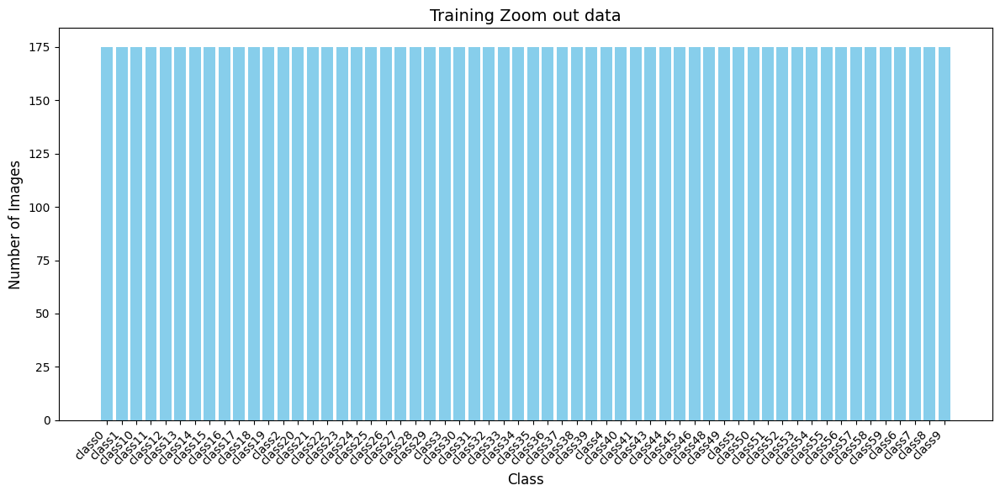

In [9]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = "dsout/train"

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Training Zoom out data", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


# Visualize Generated Zoom Out for Val Dataset

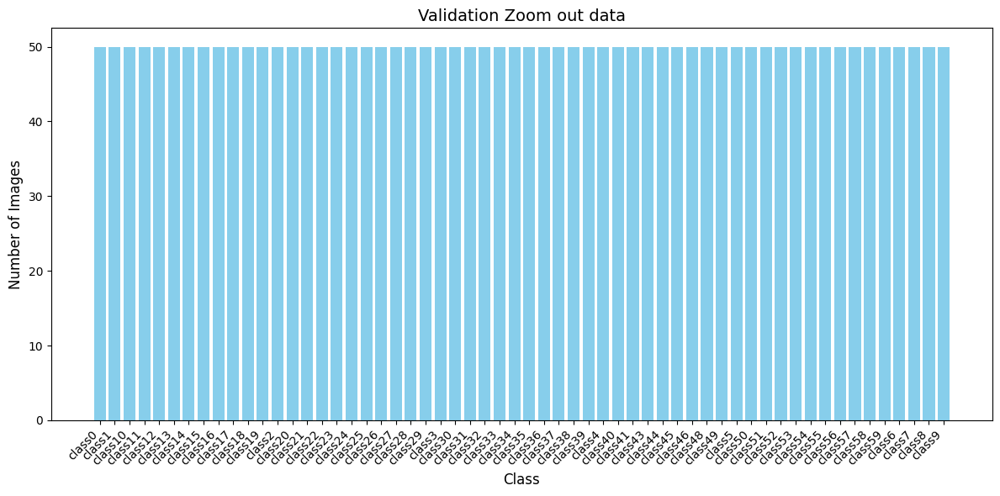

In [10]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = "dsout/val"

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Validation Zoom out data", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


## Generate Random Zoom for training set

In [11]:
import os
import random
from PIL import Image
from collections import defaultdict

def apply_zoom(image_path, label_path, zoom_factor, output_image_path, output_label_path):
    """
    Apply zoom augmentation to an image and its labels with improved bounding box adjustment
    
    Args:
    - image_path: Path to the input image
    - label_path: Path to the input label file
    - zoom_factor: Factor by which to zoom (> 1)
    - output_image_path: Path to save the zoomed image
    - output_label_path: Path to save the zoomed labels
    """
    # Load the image
    image = Image.open(image_path)
    img_width, img_height = image.size

    # Calculate crop dimensions for zoom
    crop_width = img_width / zoom_factor
    crop_height = img_height / zoom_factor
    left = (img_width - crop_width) / 2
    top = (img_height - crop_height) / 2
    right = left + crop_width
    bottom = top + crop_height

    # Crop and resize the image back to original dimensions
    cropped_image = image.crop((left, top, right, bottom))
    zoomed_image = cropped_image.resize((img_width, img_height), Image.LANCZOS)

    # Adjust bounding box labels
    zoomed_labels = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])

            # Convert normalized coordinates to pixel coordinates
            px_x_center = x_center * img_width
            px_y_center = y_center * img_height
            px_width = width * img_width
            px_height = height * img_height

            # Adjust pixel coordinates based on crop
            px_x_center = (px_x_center - left) * zoom_factor
            px_y_center = (px_y_center - top) * zoom_factor

            # Adjust pixel width and height
            px_width *= zoom_factor
            px_height *= zoom_factor

            # Convert back to normalized coordinates
            new_x_center = px_x_center / img_width
            new_y_center = px_y_center / img_height
            new_width = px_width / img_width
            new_height = px_height / img_height

            # Strictly enforce valid normalized coordinates
            new_x_center = max(0, min(1, new_x_center))
            new_y_center = max(0, min(1, new_y_center))
            new_width = max(0, min(1, new_width))
            new_height = max(0, min(1, new_height))

            # Ensure the entire bounding box is within image bounds
            if (new_x_center - new_width/2 >= 0 and 
                new_x_center + new_width/2 <= 1 and 
                new_y_center - new_height/2 >= 0 and 
                new_y_center + new_height/2 <= 1):
                # Add the modified label
                zoomed_labels.append(f"{class_id} {new_x_center:.6f} {new_y_center:.6f} {new_width:.6f} {new_height:.6f}")

    # Only save if we have valid labels
    if zoomed_labels:
        # Save the zoomed image and labels
        zoomed_image.save(output_image_path)
        with open(output_label_path, 'w') as f:
            f.writelines('\n'.join(zoomed_labels) + '\n')
        return True
    return False

def balance_dataset(base_path, target_count=350):
    """Balance all classes to have target_count images using zoom augmentation"""
    # Available zoom factors with more fine-grained progression
    zoom_factors = [round(x * 0.02 + 1.04, 2) for x in range(7)]  # [1.04, 1.06, 1.08, 1.10, 1.12, 1.14, 1.16]
    
    # Process each class directory
    class_dirs = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d)) and d.startswith('class')]
    
    for class_dir in class_dirs:
        class_path = os.path.join(base_path, class_dir)
        images_dir = os.path.join(class_path, 'images')
        labels_dir = os.path.join(class_path, 'labels')
        
        # Ensure directories exist
        os.makedirs(images_dir, exist_ok=True)
        os.makedirs(labels_dir, exist_ok=True)
        
        # Get list of original images (without zoom annotations)
        original_images = [f for f in os.listdir(images_dir) 
                         if f.endswith(('.jpg', '.jpeg', '.png')) and '(z' not in f]
        
        print(f"\nProcessing {class_dir}:")
        print(f"Original images: {len(original_images)}")
        
        current_count = len([f for f in os.listdir(images_dir) 
                           if f.endswith(('.jpg', '.jpeg', '.png'))])
        num_needed = max(0, target_count - current_count)
        
        print(f"Current total images: {current_count}")
        print(f"Additional images needed: {num_needed}")
        
        if num_needed == 0:
            print("No augmentation needed for this class")
            continue

        # Keep track of used zoom factors for each image
        used_zoom_factors = defaultdict(set)
        
        # Calculate maximum augmentations possible
        max_possible = len(original_images) * len(zoom_factors)
        if max_possible < num_needed:
            print(f"Warning: Can only generate {max_possible} unique augmentations "
                  f"({len(original_images)} images × {len(zoom_factors)} zoom factors)")
            num_needed = max_possible
        
        augmentations_created = 0
        attempts = 0
        max_attempts = num_needed * 20  # Increased attempts to account for potential rejections
        
        while augmentations_created < num_needed and attempts < max_attempts:
            attempts += 1
            
            # Get a random original image
            image_file = random.choice(original_images)
            
            # Get available zoom factors for this image
            available_factors = [f for f in zoom_factors 
                               if f not in used_zoom_factors[image_file]]
            
            if not available_factors:
                continue  # Skip if no available zoom factors for this image
                
            # Choose random zoom factor from available ones
            zoom_factor = random.choice(available_factors)
            used_zoom_factors[image_file].add(zoom_factor)
            
            # Setup paths
            label_file = os.path.splitext(image_file)[0] + '.txt'
            image_path = os.path.join(images_dir, image_file)
            label_path = os.path.join(labels_dir, label_file)
            
            # Verify label file exists
            if not os.path.exists(label_path):
                print(f"Warning: Label file not found for {image_file}")
                continue
            
            # Create output filenames with zoom factor
            base_name = os.path.splitext(image_file)[0]
            ext = os.path.splitext(image_file)[1]
            new_image_name = f"{base_name}(z{zoom_factor}){ext}"
            new_label_name = f"{base_name}(z{zoom_factor}).txt"
            
            output_image_path = os.path.join(images_dir, new_image_name)
            output_label_path = os.path.join(labels_dir, new_label_name)
            
            # Apply zoom augmentation
            if apply_zoom(image_path, label_path, zoom_factor, output_image_path, output_label_path):
                augmentations_created += 1
                if augmentations_created % 10 == 0:
                    print(f"Generated {augmentations_created}/{num_needed} augmented images")
            
        # Print statistics
        print(f"\nCompleted augmentation for {class_dir}")
        print(f"Total augmented images created: {augmentations_created}")
        print("\nZoom factors used per image:")
        for img, factors in used_zoom_factors.items():
            if factors:
                print(f"  {img}: {sorted(factors)}")

if __name__ == "__main__":
    # Path to your dataset directory containing class0, class1, etc.
    dataset_path = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\train'    # Adjust this to your dataset path
    
    print("Starting dataset balancing...")
    balance_dataset(dataset_path)
    print("\nDataset balancing completed!")

Starting dataset balancing...

Processing class0:
Original images: 362
Current total images: 362
Additional images needed: 0
No augmentation needed for this class

Processing class1:
Original images: 370
Current total images: 370
Additional images needed: 0
No augmentation needed for this class

Processing class10:
Original images: 366
Current total images: 366
Additional images needed: 0
No augmentation needed for this class

Processing class11:
Original images: 372
Current total images: 372
Additional images needed: 0
No augmentation needed for this class

Processing class12:
Original images: 370
Current total images: 370
Additional images needed: 0
No augmentation needed for this class

Processing class13:
Original images: 359
Current total images: 359
Additional images needed: 0
No augmentation needed for this class

Processing class14:
Original images: 367
Current total images: 367
Additional images needed: 0
No augmentation needed for this class

Processing class15:
Original imag

## New Data Count for Train

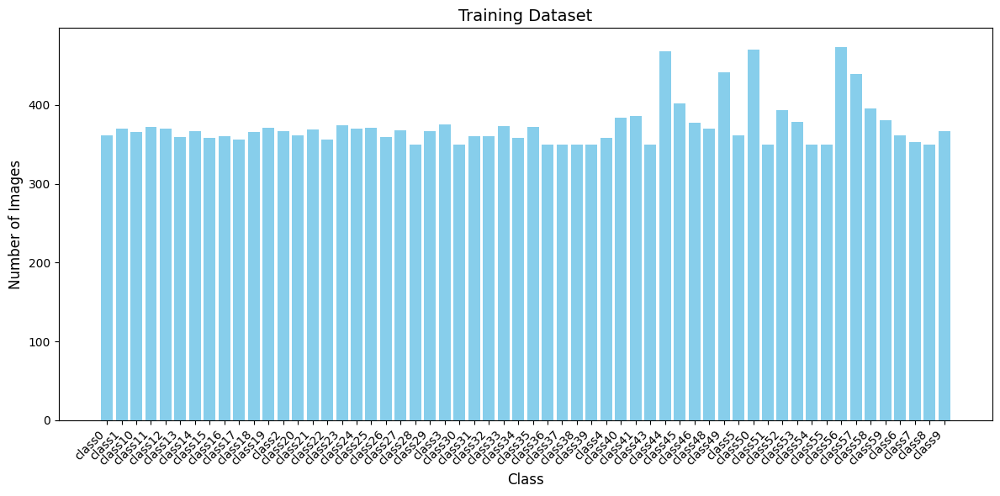

In [12]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\train'  

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Training Dataset", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


## Generate Random Zoom for validation set

In [13]:
import os
import random
from PIL import Image
from collections import defaultdict

def apply_zoom(image_path, label_path, zoom_factor, output_image_path, output_label_path):
    """
    Apply zoom augmentation to an image and its labels with improved bounding box adjustment
    
    Args:
    - image_path: Path to the input image
    - label_path: Path to the input label file
    - zoom_factor: Factor by which to zoom (> 1)
    - output_image_path: Path to save the zoomed image
    - output_label_path: Path to save the zoomed labels
    """
    # Load the image
    image = Image.open(image_path)
    img_width, img_height = image.size

    # Calculate crop dimensions for zoom
    crop_width = img_width / zoom_factor
    crop_height = img_height / zoom_factor
    left = (img_width - crop_width) / 2
    top = (img_height - crop_height) / 2
    right = left + crop_width
    bottom = top + crop_height

    # Crop and resize the image back to original dimensions
    cropped_image = image.crop((left, top, right, bottom))
    zoomed_image = cropped_image.resize((img_width, img_height), Image.LANCZOS)

    # Adjust bounding box labels
    zoomed_labels = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])

            # Convert normalized coordinates to pixel coordinates
            px_x_center = x_center * img_width
            px_y_center = y_center * img_height
            px_width = width * img_width
            px_height = height * img_height

            # Adjust pixel coordinates based on crop
            px_x_center = (px_x_center - left) * zoom_factor
            px_y_center = (px_y_center - top) * zoom_factor

            # Adjust pixel width and height
            px_width *= zoom_factor
            px_height *= zoom_factor

            # Convert back to normalized coordinates
            new_x_center = px_x_center / img_width
            new_y_center = px_y_center / img_height
            new_width = px_width / img_width
            new_height = px_height / img_height

            # Strictly enforce valid normalized coordinates
            new_x_center = max(0, min(1, new_x_center))
            new_y_center = max(0, min(1, new_y_center))
            new_width = max(0, min(1, new_width))
            new_height = max(0, min(1, new_height))

            # Ensure the entire bounding box is within image bounds
            if (new_x_center - new_width/2 >= 0 and 
                new_x_center + new_width/2 <= 1 and 
                new_y_center - new_height/2 >= 0 and 
                new_y_center + new_height/2 <= 1):
                # Add the modified label
                zoomed_labels.append(f"{class_id} {new_x_center:.6f} {new_y_center:.6f} {new_width:.6f} {new_height:.6f}")

    # Only save if we have valid labels
    if zoomed_labels:
        # Save the zoomed image and labels
        zoomed_image.save(output_image_path)
        with open(output_label_path, 'w') as f:
            f.writelines('\n'.join(zoomed_labels) + '\n')
        return True
    return False

def balance_dataset(base_path, target_count=100):
    """Balance all classes to have target_count images using zoom augmentation"""
    # Available zoom factors with more fine-grained progression
    zoom_factors = [round(x * 0.02 + 1.04, 2) for x in range(7)]  # [1.04, 1.06, 1.08, 1.10, 1.12, 1.14, 1.16]
    
    # Process each class directory
    class_dirs = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d)) and d.startswith('class')]
    
    for class_dir in class_dirs:
        class_path = os.path.join(base_path, class_dir)
        images_dir = os.path.join(class_path, 'images')
        labels_dir = os.path.join(class_path, 'labels')
        
        # Ensure directories exist
        os.makedirs(images_dir, exist_ok=True)
        os.makedirs(labels_dir, exist_ok=True)
        
        # Get list of original images (without zoom annotations)
        original_images = [f for f in os.listdir(images_dir) 
                         if f.endswith(('.jpg', '.jpeg', '.png')) and '(z' not in f]
        
        print(f"\nProcessing {class_dir}:")
        print(f"Original images: {len(original_images)}")
        
        current_count = len([f for f in os.listdir(images_dir) 
                           if f.endswith(('.jpg', '.jpeg', '.png'))])
        num_needed = max(0, target_count - current_count)
        
        print(f"Current total images: {current_count}")
        print(f"Additional images needed: {num_needed}")
        
        if num_needed == 0:
            print("No augmentation needed for this class")
            continue

        # Keep track of used zoom factors for each image
        used_zoom_factors = defaultdict(set)
        
        # Calculate maximum augmentations possible
        max_possible = len(original_images) * len(zoom_factors)
        if max_possible < num_needed:
            print(f"Warning: Can only generate {max_possible} unique augmentations "
                  f"({len(original_images)} images × {len(zoom_factors)} zoom factors)")
            num_needed = max_possible
        
        augmentations_created = 0
        attempts = 0
        max_attempts = num_needed * 20  # Increased attempts to account for potential rejections
        
        while augmentations_created < num_needed and attempts < max_attempts:
            attempts += 1
            
            # Get a random original image
            image_file = random.choice(original_images)
            
            # Get available zoom factors for this image
            available_factors = [f for f in zoom_factors 
                               if f not in used_zoom_factors[image_file]]
            
            if not available_factors:
                continue  # Skip if no available zoom factors for this image
                
            # Choose random zoom factor from available ones
            zoom_factor = random.choice(available_factors)
            used_zoom_factors[image_file].add(zoom_factor)
            
            # Setup paths
            label_file = os.path.splitext(image_file)[0] + '.txt'
            image_path = os.path.join(images_dir, image_file)
            label_path = os.path.join(labels_dir, label_file)
            
            # Verify label file exists
            if not os.path.exists(label_path):
                print(f"Warning: Label file not found for {image_file}")
                continue
            
            # Create output filenames with zoom factor
            base_name = os.path.splitext(image_file)[0]
            ext = os.path.splitext(image_file)[1]
            new_image_name = f"{base_name}(z{zoom_factor}){ext}"
            new_label_name = f"{base_name}(z{zoom_factor}).txt"
            
            output_image_path = os.path.join(images_dir, new_image_name)
            output_label_path = os.path.join(labels_dir, new_label_name)
            
            # Apply zoom augmentation
            if apply_zoom(image_path, label_path, zoom_factor, output_image_path, output_label_path):
                augmentations_created += 1
                if augmentations_created % 10 == 0:
                    print(f"Generated {augmentations_created}/{num_needed} augmented images")
            
        # Print statistics
        print(f"\nCompleted augmentation for {class_dir}")
        print(f"Total augmented images created: {augmentations_created}")
        print("\nZoom factors used per image:")
        for img, factors in used_zoom_factors.items():
            if factors:
                print(f"  {img}: {sorted(factors)}")

if __name__ == "__main__":
    # Path to your dataset directory containing class0, class1, etc.
    dataset_path = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\val'    # Adjust this to your dataset path
    
    print("Starting dataset balancing...")
    balance_dataset(dataset_path)
    print("\nDataset balancing completed!")

Starting dataset balancing...

Processing class0:
Original images: 92
Current total images: 92
Additional images needed: 8

Completed augmentation for class0
Total augmented images created: 8

Zoom factors used per image:
  env_Balete-GG-6-_jpg.rf.2ed68707ea53880c17cf66e7ab044905.jpg: [1.12, 1.14]
  white_bg_Balete-B-48-_jpg.rf.8df55462b46eb10e36bd84b733670f42.jpg: [1.08]
  env_Balete-O-27-_JPG.rf.c224d74606c063e2b0a00901696799b5.jpg: [1.04, 1.1]
  env_Balete-M-23-_jpg.rf.284f3e446a13e0131664cebffaccb629_aug_90_27.jpg: [1.14]
  white_bg_Balete-C-41-_jpg.rf.929586d8a40841138347bc522d138ad2.jpg: [1.08]
  white_bg_Balete-C-70-_jpg.rf.1ae7230a0314ff032f79f0bcab9e9f16.jpg: [1.08]
  env_Balete-D-17-_jpg.rf.20e615d6c6d4d769964de6e04d8a1f8a.jpg: [1.08]
  env_Balete-B-21-_jpg.rf.a4ecb94ad8a34a81bf871221027d6d25.jpg: [1.14]
  white_bg_Balete-C-1-_jpg.rf.10bc8131c8317559a46d908d3ddaa180.jpg: [1.06]
  env_Balete-BB-9-_jpg.rf.762c3a19d709f7b1d2f2a0e9010fe85c_aug_180_28.jpg: [1.14]

Processing class

## New Data Count for Val

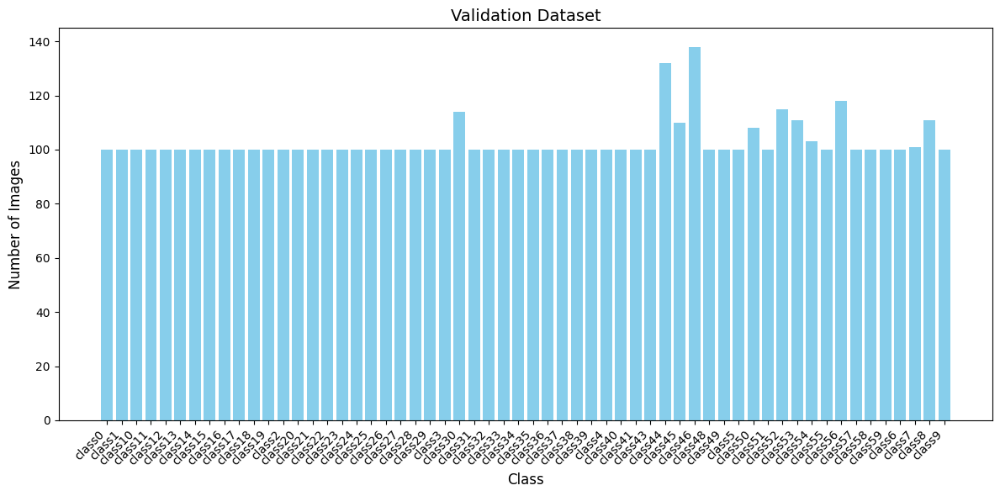

In [14]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\val'  

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Validation Dataset", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


## Extra Data Clean-up for Validation Dataset

In [16]:
import os
import random

def cleanup_excess_images(base_path=r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\val'  , target_count=100):
    """
    Randomly delete images and labels for classes that exceed the target count.
    
    Args:
    - base_path: Path to the dataset directory containing the validation dataset (default is 'dsds/val').
    - target_count: Maximum number of images allowed per class.
    """
    # Iterate through each class directory
    class_dirs = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d))]

    for class_dir in class_dirs:
        class_path = os.path.join(base_path, class_dir)
        images_dir = os.path.join(class_path, 'images')
        labels_dir = os.path.join(class_path, 'labels')
        
        if not os.path.exists(images_dir) or not os.path.exists(labels_dir):
            print(f"Skipping {class_dir}: 'images' or 'labels' directory not found.")
            continue
        
        # Get list of all images
        all_images = [f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png', '.gif'))]
        current_count = len(all_images)
        
        print(f"\nProcessing {class_dir}:")
        print(f"Current image count: {current_count}")
        
        if current_count > target_count:
            num_to_delete = current_count - target_count
            print(f"Need to delete {num_to_delete} images.")
            
            # Prefer deleting augmented images first (identified by patterns like '(z' in filename)
            augmented_images = [img for img in all_images if '(z' in img]
            deletion_candidates = augmented_images if augmented_images else all_images
            
            # Randomly select images to delete
            images_to_delete = random.sample(deletion_candidates, num_to_delete)
            
            # Delete selected images and their corresponding labels
            for image_to_delete in images_to_delete:
                # Remove image
                image_path = os.path.join(images_dir, image_to_delete)
                os.remove(image_path)
                
                # Remove corresponding label
                label_name = os.path.splitext(image_to_delete)[0] + '.txt'
                label_path = os.path.join(labels_dir, label_name)
                if os.path.exists(label_path):
                    os.remove(label_path)
            
            # Verify final count
            remaining_images = len([f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png', '.gif'))])
            print(f"Images after cleanup: {remaining_images}")
        else:
            print(f"No deletion required for {class_dir}.")

# Call the function
cleanup_excess_images(base_path=r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\val', target_count=100)



Processing class0:
Current image count: 100
No deletion required for class0.

Processing class1:
Current image count: 100
No deletion required for class1.

Processing class10:
Current image count: 100
No deletion required for class10.

Processing class11:
Current image count: 100
No deletion required for class11.

Processing class12:
Current image count: 100
No deletion required for class12.

Processing class13:
Current image count: 100
No deletion required for class13.

Processing class14:
Current image count: 100
No deletion required for class14.

Processing class15:
Current image count: 100
No deletion required for class15.

Processing class16:
Current image count: 100
No deletion required for class16.

Processing class17:
Current image count: 100
No deletion required for class17.

Processing class18:
Current image count: 100
No deletion required for class18.

Processing class19:
Current image count: 100
No deletion required for class19.

Processing class2:
Current image count: 100

# Extra Data Clean-up for Train Dataset

In [ ]:
import os
import random

def cleanup_excess_images(base_path=r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\train'  , target_count=350):
    """
    Randomly delete images and labels for classes that exceed the target count.
    
    Args:
    - base_path: Path to the dataset directory containing the validation dataset (default is 'dsds/val').
    - target_count: Maximum number of images allowed per class.
    """
    # Iterate through each class directory
    class_dirs = [d for d in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, d))]

    for class_dir in class_dirs:
        class_path = os.path.join(base_path, class_dir)
        images_dir = os.path.join(class_path, 'images')
        labels_dir = os.path.join(class_path, 'labels')
        
        if not os.path.exists(images_dir) or not os.path.exists(labels_dir):
            print(f"Skipping {class_dir}: 'images' or 'labels' directory not found.")
            continue
        
        # Get list of all images
        all_images = [f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png', '.gif'))]
        current_count = len(all_images)
        
        print(f"\nProcessing {class_dir}:")
        print(f"Current image count: {current_count}")
        
        if current_count > target_count:
            num_to_delete = current_count - target_count
            print(f"Need to delete {num_to_delete} images.")
            
            # Prefer deleting augmented images first (identified by patterns like '(z' in filename)
            augmented_images = [img for img in all_images if '(z' in img]
            deletion_candidates = augmented_images if augmented_images else all_images
            
            # Randomly select images to delete
            images_to_delete = random.sample(deletion_candidates, num_to_delete)
            
            # Delete selected images and their corresponding labels
            for image_to_delete in images_to_delete:
                # Remove image
                image_path = os.path.join(images_dir, image_to_delete)
                os.remove(image_path)
                
                # Remove corresponding label
                label_name = os.path.splitext(image_to_delete)[0] + '.txt'
                label_path = os.path.join(labels_dir, label_name)
                if os.path.exists(label_path):
                    os.remove(label_path)
            
            # Verify final count
            remaining_images = len([f for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png', '.gif'))])
            print(f"Images after cleanup: {remaining_images}")
        else:
            print(f"No deletion required for {class_dir}.")

# Call the function
cleanup_excess_images(base_path=r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\train', target_count=350)



Processing class0:
Current image count: 362
Need to delete 12 images.
Images after cleanup: 350

Processing class1:
Current image count: 370
Need to delete 20 images.
Images after cleanup: 350

Processing class10:
Current image count: 366
Need to delete 16 images.
Images after cleanup: 350

Processing class11:
Current image count: 372
Need to delete 22 images.
Images after cleanup: 350

Processing class12:
Current image count: 370
Need to delete 20 images.
Images after cleanup: 350

Processing class13:
Current image count: 359
Need to delete 9 images.
Images after cleanup: 350

Processing class14:
Current image count: 367
Need to delete 17 images.
Images after cleanup: 350

Processing class15:
Current image count: 358
Need to delete 8 images.
Images after cleanup: 350

Processing class16:
Current image count: 360
Need to delete 10 images.
Images after cleanup: 350

Processing class17:
Current image count: 356
Need to delete 6 images.
Images after cleanup: 350

Processing class18:
Curr

## Train/Val Data Count After Cleanup

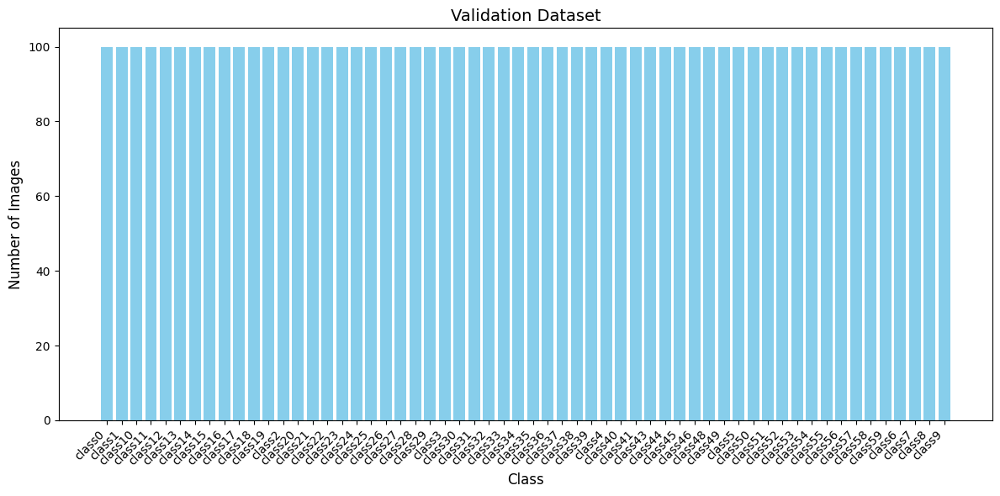

In [ ]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\val' # Change this based from your val and train folder path

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Validation Dataset", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


## Combine zoom out and in before Augmenting

In [21]:
import os
import shutil

def copy_files(src_dir, dest_dir):
    """
    Recursively copy files from the source directory to the destination directory,
    maintaining the directory structure.
    
    Args:
    - src_dir: The source directory to copy from
    - dest_dir: The destination directory to copy to
    """
    # Walk through the source directory
    for root, dirs, files in os.walk(src_dir):
        # Calculate relative path from the source directory
        rel_path = os.path.relpath(root, src_dir)
        # Define the corresponding destination path
        dest_path = os.path.join(dest_dir, rel_path)
        
        # Create the directories in the destination if they don't exist
        os.makedirs(dest_path, exist_ok=True)
        
        # Copy each file to the destination
        for file in files:
            src_file = os.path.join(root, file)
            dest_file = os.path.join(dest_path, file)
            shutil.copy2(src_file, dest_file)  # copy2 to preserve file metadata
            print(f"Copied: {src_file} -> {dest_file}")

def main():
    # Define source and destination directories
    src_train_dir = r"E:\Snapfolia - CS\model\snapfolia\leaf-classification-notebook-v6\dsout\train"
    src_val_dir = r"E:\Snapfolia - CS\model\snapfolia\leaf-classification-notebook-v6\dsout\val"
    dest_train_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\train' 
    dest_val_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\val' 
    
    # Copy from dsout/train to dstest/train
    print("Copying files from dsout/train to dstest/train...")
    copy_files(src_train_dir, dest_train_dir)
    
    # Copy from dsout/val to dstest/val
    print("Copying files from dsout/val to dstest/val...")
    copy_files(src_val_dir, dest_val_dir)
    
    print("\nFiles copied successfully!")

if __name__ == "__main__":
    main()


Copying files from dsout/train to dstest/train...
Copied: E:\Snapfolia - CS\model\snapfolia\leaf-classification-notebook-v6\dsout\train\class0\images\white_bg_Balete-C-61-_jpg.rf.5006e96da6fce8d4f92ddc7fcf21b6fa(z0.88).jpg -> F:\SNAPFOLIA\OBJ_REAL_FOLDER\train\class0\images\white_bg_Balete-C-61-_jpg.rf.5006e96da6fce8d4f92ddc7fcf21b6fa(z0.88).jpg
Copied: E:\Snapfolia - CS\model\snapfolia\leaf-classification-notebook-v6\dsout\train\class0\images\env_Balete-O-41-_JPG.rf.e51a7f10ee8a74198c6f78fc4f05df5f(z0.84).jpg -> F:\SNAPFOLIA\OBJ_REAL_FOLDER\train\class0\images\env_Balete-O-41-_JPG.rf.e51a7f10ee8a74198c6f78fc4f05df5f(z0.84).jpg
Copied: E:\Snapfolia - CS\model\snapfolia\leaf-classification-notebook-v6\dsout\train\class0\images\env_Balete-B-28-_jpg.rf.6ea8f7156d8a3780308c8ab89e56f4e2_aug_90_0(z0.64).jpg -> F:\SNAPFOLIA\OBJ_REAL_FOLDER\train\class0\images\env_Balete-B-28-_jpg.rf.6ea8f7156d8a3780308c8ab89e56f4e2_aug_90_0(z0.64).jpg
Copied: E:\Snapfolia - CS\model\snapfolia\leaf-classificat

# Combined Val Dataset Visualization

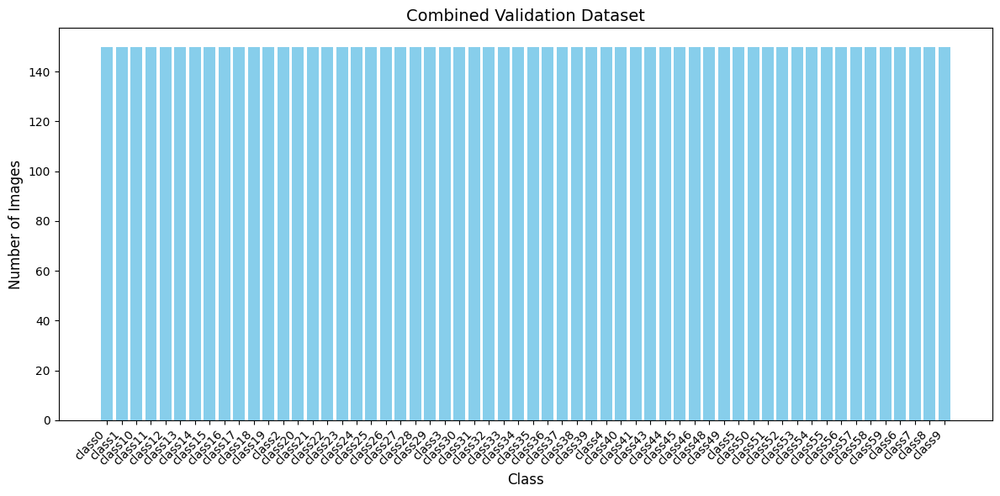

In [22]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\val' 

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Combined Validation Dataset", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


# Combined Training Dataset Visualization

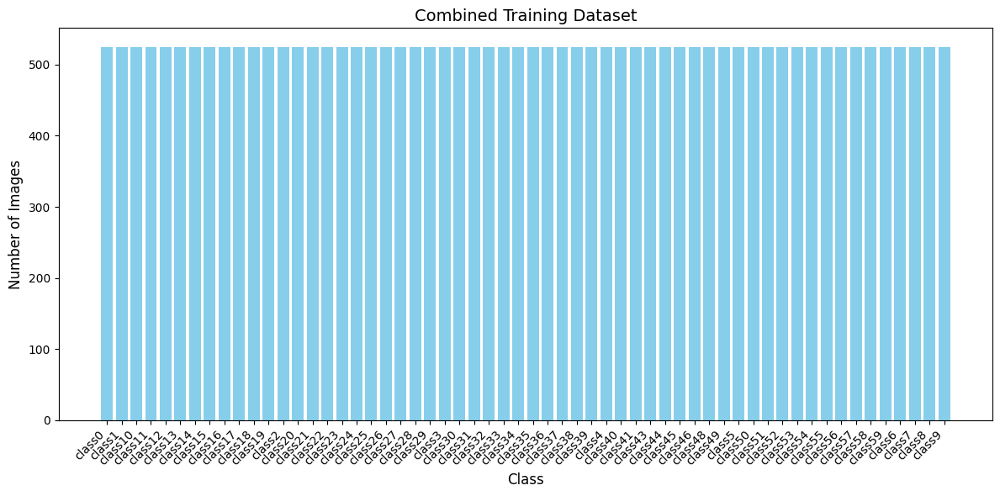

In [23]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\train' 

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Combined Training Dataset", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


## Generate Rotations for Val

In [24]:
import os
import cv2
import numpy as np
import shutil

def rotate_box(box, angle, image_width, image_height):
    """Rotate a YOLO bounding box."""
    # Convert YOLO format to absolute coordinates
    x_center, y_center = box[1] * image_width, box[2] * image_height
    width, height = box[3] * image_width, box[4] * image_height
    
    # Calculate corners
    x1 = x_center - width / 2
    y1 = y_center - height / 2
    x2 = x_center + width / 2
    y2 = y_center + height / 2
    
    # Create rotation matrix
    center = (image_width / 2, image_height / 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    
    # Rotate corners
    points = np.array([[x1, y1], [x2, y1], [x2, y2], [x1, y2]], dtype=np.float32)
    rotated_points = np.array([rotation_matrix.dot([p[0], p[1], 1]) for p in points])
    
    # Get new bounding box
    x_min = np.min(rotated_points[:, 0])
    y_min = np.min(rotated_points[:, 1])
    x_max = np.max(rotated_points[:, 0])
    y_max = np.max(rotated_points[:, 1])
    
    # Convert back to YOLO format
    new_x_center = (x_min + x_max) / 2 / image_width
    new_y_center = (y_min + y_max) / 2 / image_height
    new_width = (x_max - x_min) / image_width
    new_height = (y_max - y_min) / image_height
    
    # Clip values to ensure they stay within [0, 1]
    new_x_center = np.clip(new_x_center, 0, 1)
    new_y_center = np.clip(new_y_center, 0, 1)
    new_width = np.clip(new_width, 0, 1)
    new_height = np.clip(new_height, 0, 1)
    
    return [box[0], new_x_center, new_y_center, new_width, new_height]

def augment_class(original_class_path, target_count, angles=[90, 180, 270]):
    """Augment images and labels for a specific class until reaching target count."""
    images_path = os.path.join(original_class_path, "images")
    labels_path = os.path.join(original_class_path, "labels")
    
    # Copy original files first
    image_files = [f for f in os.listdir(images_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    current_count = len(image_files)
    if current_count >= target_count:
        return
    
    augmentation_needed = target_count - current_count
    aug_counter = 0
    angle_idx = 0
    
    while aug_counter < augmentation_needed:
        for img_file in image_files:
            if aug_counter >= augmentation_needed:
                break
                
            label_file = img_file.rsplit('.', 1)[0] + '.txt'
            img_path = os.path.join(images_path, img_file)
            label_path = os.path.join(labels_path, label_file)
            
            if not os.path.exists(label_path):
                continue
                
            img = cv2.imread(img_path)
            height, width = img.shape[:2]
            
            angle = angles[angle_idx % len(angles)]
            rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), angle, 1.0)
            rotated_img = cv2.warpAffine(img, rotation_matrix, (width, height))
            
            with open(label_path, 'r') as f:
                labels = [line.strip().split() for line in f.readlines()]
            
            rotated_labels = []
            for label in labels:
                label = [float(x) if i > 0 else int(x) for i, x in enumerate(label)]
                rotated_label = rotate_box(label, angle, width, height)
                rotated_labels.append(rotated_label)
            
            aug_suffix = f'_aug_{angle}_{aug_counter}'
            new_img_file = f"{img_file.rsplit('.', 1)[0]}{aug_suffix}.{img_file.rsplit('.', 1)[1]}"
            new_label_file = f"{label_file.rsplit('.', 1)[0]}{aug_suffix}.txt"
            
            cv2.imwrite(os.path.join(images_path, new_img_file), rotated_img)
            
            with open(os.path.join(labels_path, new_label_file), 'w') as f:
                for label in rotated_labels:
                    f.write(f"{int(label[0])} {' '.join(str(x) for x in label[1:])}\n")
            
            aug_counter += 1
            angle_idx += 1

def balance_dataset(train_dir, target_count=None):
    """Balance the dataset by augmenting classes with fewer images."""
    # Count images per class
    class_counts = {}
    for class_name in os.listdir(train_dir):
        class_path = os.path.join(train_dir, class_name, "images")
        if os.path.isdir(class_path):
            class_counts[class_name] = len([f for f in os.listdir(class_path) 
                                          if os.path.isfile(os.path.join(class_path, f))])
    
    # If target_count not specified, use the maximum class count
    if target_count is None:
        target_count = max(class_counts.values())
    
    print(f"Target count per class: {target_count}")
    
    # Process each class
    for class_name, count in class_counts.items():
        print(f"\nProcessing class '{class_name}' ({count} images)")
        original_class_path = os.path.join(train_dir, class_name)
        augment_class(original_class_path, target_count)
        
        # Verify new count
        new_count = len([f for f in os.listdir(os.path.join(original_class_path, "images")) 
                        if os.path.isfile(os.path.join(original_class_path, "images", f))])
        print(f"Augmented '{class_name}' to {new_count} images")
    
    print(f"\nDataset augmentation complete.")

# Example usage
if __name__ == "__main__":
    train_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\val' 
    balance_dataset(train_dir, target_count=300)  # 349 is the size of the largest class


Target count per class: 300

Processing class 'class0' (150 images)
Augmented 'class0' to 299 images

Processing class 'class1' (150 images)
Augmented 'class1' to 300 images

Processing class 'class10' (150 images)
Augmented 'class10' to 300 images

Processing class 'class11' (150 images)
Augmented 'class11' to 300 images

Processing class 'class12' (150 images)
Augmented 'class12' to 300 images

Processing class 'class13' (150 images)
Augmented 'class13' to 299 images

Processing class 'class14' (150 images)
Augmented 'class14' to 299 images

Processing class 'class15' (150 images)
Augmented 'class15' to 300 images

Processing class 'class16' (150 images)
Augmented 'class16' to 300 images

Processing class 'class17' (150 images)
Augmented 'class17' to 300 images

Processing class 'class18' (150 images)
Augmented 'class18' to 300 images

Processing class 'class19' (150 images)
Augmented 'class19' to 300 images

Processing class 'class2' (150 images)
Augmented 'class2' to 300 images

Pr

# Generate Rotations for Train Dataset

In [25]:
import os
import cv2
import numpy as np
import shutil

def rotate_box(box, angle, image_width, image_height):
    """Rotate a YOLO bounding box."""
    # Convert YOLO format to absolute coordinates
    x_center, y_center = box[1] * image_width, box[2] * image_height
    width, height = box[3] * image_width, box[4] * image_height
    
    # Calculate corners
    x1 = x_center - width / 2
    y1 = y_center - height / 2
    x2 = x_center + width / 2
    y2 = y_center + height / 2
    
    # Create rotation matrix
    center = (image_width / 2, image_height / 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    
    # Rotate corners
    points = np.array([[x1, y1], [x2, y1], [x2, y2], [x1, y2]], dtype=np.float32)
    rotated_points = np.array([rotation_matrix.dot([p[0], p[1], 1]) for p in points])
    
    # Get new bounding box
    x_min = np.min(rotated_points[:, 0])
    y_min = np.min(rotated_points[:, 1])
    x_max = np.max(rotated_points[:, 0])
    y_max = np.max(rotated_points[:, 1])
    
    # Convert back to YOLO format
    new_x_center = (x_min + x_max) / 2 / image_width
    new_y_center = (y_min + y_max) / 2 / image_height
    new_width = (x_max - x_min) / image_width
    new_height = (y_max - y_min) / image_height
    
    # Clip values to ensure they stay within [0, 1]
    new_x_center = np.clip(new_x_center, 0, 1)
    new_y_center = np.clip(new_y_center, 0, 1)
    new_width = np.clip(new_width, 0, 1)
    new_height = np.clip(new_height, 0, 1)
    
    return [box[0], new_x_center, new_y_center, new_width, new_height]

def augment_class(original_class_path, target_count, angles=[90, 180, 270]):
    """Augment images and labels for a specific class until reaching target count."""
    images_path = os.path.join(original_class_path, "images")
    labels_path = os.path.join(original_class_path, "labels")
    
    # Copy original files first
    image_files = [f for f in os.listdir(images_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
    current_count = len(image_files)
    if current_count >= target_count:
        return
    
    augmentation_needed = target_count - current_count
    aug_counter = 0
    angle_idx = 0
    
    while aug_counter < augmentation_needed:
        for img_file in image_files:
            if aug_counter >= augmentation_needed:
                break
                
            label_file = img_file.rsplit('.', 1)[0] + '.txt'
            img_path = os.path.join(images_path, img_file)
            label_path = os.path.join(labels_path, label_file)
            
            if not os.path.exists(label_path):
                continue
                
            img = cv2.imread(img_path)
            height, width = img.shape[:2]
            
            angle = angles[angle_idx % len(angles)]
            rotation_matrix = cv2.getRotationMatrix2D((width / 2, height / 2), angle, 1.0)
            rotated_img = cv2.warpAffine(img, rotation_matrix, (width, height))
            
            with open(label_path, 'r') as f:
                labels = [line.strip().split() for line in f.readlines()]
            
            rotated_labels = []
            for label in labels:
                label = [float(x) if i > 0 else int(x) for i, x in enumerate(label)]
                rotated_label = rotate_box(label, angle, width, height)
                rotated_labels.append(rotated_label)
            
            aug_suffix = f'_aug_{angle}_{aug_counter}'
            new_img_file = f"{img_file.rsplit('.', 1)[0]}{aug_suffix}.{img_file.rsplit('.', 1)[1]}"
            new_label_file = f"{label_file.rsplit('.', 1)[0]}{aug_suffix}.txt"
            
            cv2.imwrite(os.path.join(images_path, new_img_file), rotated_img)
            
            with open(os.path.join(labels_path, new_label_file), 'w') as f:
                for label in rotated_labels:
                    f.write(f"{int(label[0])} {' '.join(str(x) for x in label[1:])}\n")
            
            aug_counter += 1
            angle_idx += 1

def balance_dataset(train_dir, target_count=None):
    """Balance the dataset by augmenting classes with fewer images."""
    # Count images per class
    class_counts = {}
    for class_name in os.listdir(train_dir):
        class_path = os.path.join(train_dir, class_name, "images")
        if os.path.isdir(class_path):
            class_counts[class_name] = len([f for f in os.listdir(class_path) 
                                          if os.path.isfile(os.path.join(class_path, f))])
    
    # If target_count not specified, use the maximum class count
    if target_count is None:
        target_count = max(class_counts.values())
    
    print(f"Target count per class: {target_count}")
    
    # Process each class
    for class_name, count in class_counts.items():
        print(f"\nProcessing class '{class_name}' ({count} images)")
        original_class_path = os.path.join(train_dir, class_name)
        augment_class(original_class_path, target_count)
        
        # Verify new count
        new_count = len([f for f in os.listdir(os.path.join(original_class_path, "images")) 
                        if os.path.isfile(os.path.join(original_class_path, "images", f))])
        print(f"Augmented '{class_name}' to {new_count} images")
    
    print(f"\nDataset augmentation complete.")

# Example usage
if __name__ == "__main__":
    train_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\train' 
    balance_dataset(train_dir, target_count=525)  # 349 is the size of the largest class


Target count per class: 525

Processing class 'class0' (525 images)
Augmented 'class0' to 525 images

Processing class 'class1' (525 images)
Augmented 'class1' to 525 images

Processing class 'class10' (525 images)
Augmented 'class10' to 525 images

Processing class 'class11' (525 images)
Augmented 'class11' to 525 images

Processing class 'class12' (525 images)
Augmented 'class12' to 525 images

Processing class 'class13' (525 images)
Augmented 'class13' to 525 images

Processing class 'class14' (525 images)
Augmented 'class14' to 525 images

Processing class 'class15' (525 images)
Augmented 'class15' to 525 images

Processing class 'class16' (525 images)
Augmented 'class16' to 525 images

Processing class 'class17' (525 images)
Augmented 'class17' to 525 images

Processing class 'class18' (525 images)
Augmented 'class18' to 525 images

Processing class 'class19' (525 images)
Augmented 'class19' to 525 images

Processing class 'class2' (525 images)
Augmented 'class2' to 525 images

Pr

# Visualize Train Dataset

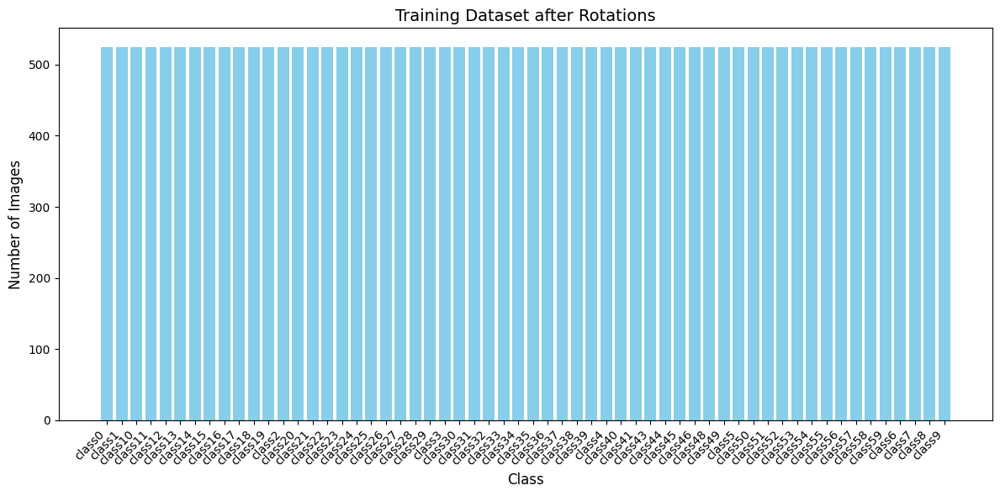

In [29]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\train' 

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Training Dataset after Rotations", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


# Visualize Validation Dataset

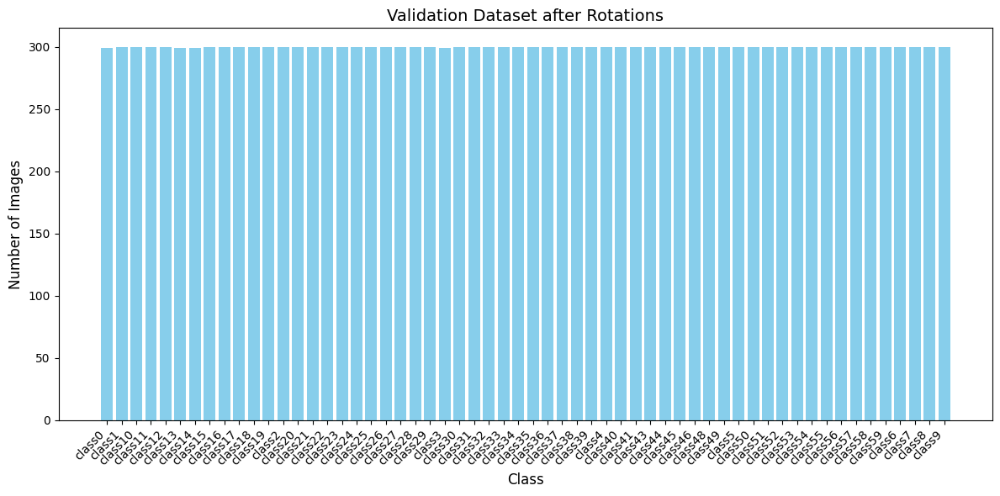

In [28]:
import os
import matplotlib.pyplot as plt

# Path to your training dataset
train_dir = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\val' 

# Count images per class
class_counts = {}

for class_name in os.listdir(train_dir):
    class_path = os.path.join(train_dir, class_name, "images")
    if os.path.isdir(class_path):
        class_counts[class_name] = len([f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))])

# Sort the counts for better visualization
class_counts = dict(sorted(class_counts.items(), key=lambda x: x[0]))

# Plot the chart
plt.figure(figsize=(12, 6))
plt.bar(class_counts.keys(), class_counts.values(), color="skyblue")
plt.xlabel("Class", fontsize=12)
plt.ylabel("Number of Images", fontsize=12)
plt.title("Validation Dataset after Rotations", fontsize=14)
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.tight_layout()
plt.show()


## Plot Random Samples from Train (Optional)

Plotting random samples from the dataset...


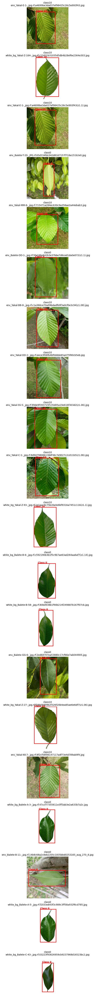

Done!


In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def plot_image_with_boxes(image_path, label_path, ax, title):
    """Plot an image with its bounding boxes and title"""
    # Load image
    image = Image.open(image_path)
    img_width, img_height = image.size

    # Plot image
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(title, fontsize=10, wrap=True)

    # Read and plot bounding boxes
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                class_id = int(parts[0])
                x_center, y_center, width, height = map(float, parts[1:])

                # Convert YOLO format to corner coordinates
                x_min = (x_center - width / 2) * img_width
                y_min = (y_center - height / 2) * img_height
                box_width = width * img_width
                box_height = height * img_height

                # Draw bounding box
                rect = patches.Rectangle(
                    (x_min, y_min), box_width, box_height,
                    linewidth=2, edgecolor='r', facecolor='none'
                )
                ax.add_patch(rect)
                ax.text(x_min, y_min - 5, f"Class {class_id}", 
                        color='red', fontsize=10, weight='bold')

def plot_random_dataset_samples(base_path, num_samples=20, figsize=(3, 3)):
    """Plot random samples from the dataset in a single column"""
    # Get all class directories
    class_dirs = [d for d in os.listdir(base_path) if d.startswith('class')]
    
    # Collect all image paths and their corresponding label paths
    all_images = []
    for class_dir in class_dirs:
        images_dir = os.path.join(base_path, class_dir, 'images')
        labels_dir = os.path.join(base_path, class_dir, 'labels')
        
        for image_file in os.listdir(images_dir):
            if image_file.endswith(('.jpg', '.jpeg', '.png')):
                image_path = os.path.join(images_dir, image_file)
                label_path = os.path.join(labels_dir, 
                                        os.path.splitext(image_file)[0] + '.txt')
                all_images.append((image_path, label_path, class_dir))
    
    # Randomly select images
    selected_images = random.sample(all_images, min(num_samples, len(all_images)))
    
    # Create subplot grid for a single column
    num_rows = len(selected_images)
    fig, axs = plt.subplots(num_rows, 1, figsize=(figsize[0], num_rows * figsize[1]))
    
    if num_rows == 1:  # Handle case where only one sample is selected
        axs = [axs]
    
    # Plot each selected image
    for i, (image_path, label_path, class_dir) in enumerate(selected_images):
        # Create title from filename and class
        filename = os.path.basename(image_path)
        title = f"{class_dir}\n{filename}"
        
        # Plot image with boxes
        plot_image_with_boxes(image_path, label_path, axs[i], title)
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Path to your dataset directory containing class0, class1, etc.
    dataset_path = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\train'   # Adjust this to your dataset path
    
    print("Plotting random samples from the dataset...")
    plot_random_dataset_samples(dataset_path, num_samples=20)
    print("Done!")


## Plot Random Samples from Val (Optional)

Plotting random samples from the dataset...


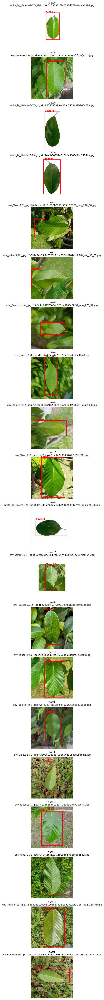

Done!


In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def plot_image_with_boxes(image_path, label_path, ax, title):
    """Plot an image with its bounding boxes and title"""
    # Load image
    image = Image.open(image_path)
    img_width, img_height = image.size

    # Plot image
    ax.imshow(image)
    ax.axis('off')
    ax.set_title(title, fontsize=10, wrap=True)

    # Read and plot bounding boxes
    if os.path.exists(label_path):
        with open(label_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                class_id = int(parts[0])
                x_center, y_center, width, height = map(float, parts[1:])

                # Convert YOLO format to corner coordinates
                x_min = (x_center - width / 2) * img_width
                y_min = (y_center - height / 2) * img_height
                box_width = width * img_width
                box_height = height * img_height

                # Draw bounding box
                rect = patches.Rectangle(
                    (x_min, y_min), box_width, box_height,
                    linewidth=2, edgecolor='r', facecolor='none'
                )
                ax.add_patch(rect)
                ax.text(x_min, y_min - 5, f"Class {class_id}", 
                        color='red', fontsize=10, weight='bold')

def plot_random_dataset_samples(base_path, num_samples=20, figsize=(3, 3)):
    """Plot random samples from the dataset in a single column"""
    # Get all class directories
    class_dirs = [d for d in os.listdir(base_path) if d.startswith('class')]
    
    # Collect all image paths and their corresponding label paths
    all_images = []
    for class_dir in class_dirs:
        images_dir = os.path.join(base_path, class_dir, 'images')
        labels_dir = os.path.join(base_path, class_dir, 'labels')
        
        for image_file in os.listdir(images_dir):
            if image_file.endswith(('.jpg', '.jpeg', '.png')):
                image_path = os.path.join(images_dir, image_file)
                label_path = os.path.join(labels_dir, 
                                        os.path.splitext(image_file)[0] + '.txt')
                all_images.append((image_path, label_path, class_dir))
    
    # Randomly select images
    selected_images = random.sample(all_images, min(num_samples, len(all_images)))
    
    # Create subplot grid for a single column
    num_rows = len(selected_images)
    fig, axs = plt.subplots(num_rows, 1, figsize=(figsize[0], num_rows * figsize[1]))
    
    if num_rows == 1:  # Handle case where only one sample is selected
        axs = [axs]
    
    # Plot each selected image
    for i, (image_path, label_path, class_dir) in enumerate(selected_images):
        # Create title from filename and class
        filename = os.path.basename(image_path)
        title = f"{class_dir}\n{filename}"
        
        # Plot image with boxes
        plot_image_with_boxes(image_path, label_path, axs[i], title)
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    # Path to your dataset directory containing class0, class1, etc.
    dataset_path = r'F:\SNAPFOLIA\OBJ_REAL_FOLDER\val'   # Adjust this to your dataset path
    
    print("Plotting random samples from the dataset...")
    plot_random_dataset_samples(dataset_path, num_samples=20)
    print("Done!")


## Plot Specific Images (Optional)

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Function to plot image with bounding boxes and original image side by side
def plot_original_and_zoomed(original_image_path, zoomed_image_path, original_label_path, zoomed_label_path):
    # Load images
    original_image = Image.open(original_image_path)
    zoomed_image = Image.open(zoomed_image_path)
    img_width, img_height = zoomed_image.size

    # Create a figure with two subplots for the original and zoomed images
    fig, axs = plt.subplots(1, 2, figsize=(15, 10))

    # Plot the original image
    axs[0].imshow(original_image)
    axs[0].axis('off')
    axs[0].set_title("Original Image")

    # Plot the zoomed image with bounding boxes
    axs[1].imshow(zoomed_image)
    axs[1].axis('off')
    axs[1].set_title("Generated Zoomed Image")

    # Read and plot bounding boxes for the original image
    with open(original_label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])

            # Convert YOLO format to corner coordinates
            x_min = (x_center - width / 2) * img_width
            y_min = (y_center - height / 2) * img_height
            x_max = (x_center + width / 2) * img_width
            y_max = (y_center + height / 2) * img_height

            # Draw bounding box on the original image
            rect = patches.Rectangle(
                (x_min, y_min), x_max - x_min, y_max - y_min,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            axs[0].add_patch(rect)
            axs[0].text(x_min, y_min - 5, f"Class {class_id}", color='red', fontsize=10, weight='bold')

    # Read and plot bounding boxes for the zoomed image
    with open(zoomed_label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            x_center, y_center, width, height = map(float, parts[1:])

            # Convert YOLO format to corner coordinates
            x_min = (x_center - width / 2) * img_width
            y_min = (y_center - height / 2) * img_height
            x_max = (x_center + width / 2) * img_width
            y_max = (y_center + height / 2) * img_height

            # Draw bounding box on the zoomed image
            rect = patches.Rectangle(
                (x_min, y_min), x_max - x_min, y_max - y_min,
                linewidth=2, edgecolor='r', facecolor='none'
            )
            axs[1].add_patch(rect)
            axs[1].text(x_min, y_min - 5, f"Class {class_id}", color='red', fontsize=10, weight='bold')

    plt.tight_layout()
    plt.show()

# File paths
original_image_path = "dsds/val/class20/images/env_Sintores-SS-1-_jpg.rf.d998a5d8243d075eeea3ae06f0252958.jpg"
zoomed_image_path = "dsds/val/class20/images/env_Sintores-SS-1-_jpg.rf.d998a5d8243d075eeea3ae06f0252958(z1.16).jpg"
original_label_path = "dsds/val/class20/labels/env_Sintores-SS-1-_jpg.rf.d998a5d8243d075eeea3ae06f0252958.txt"
zoomed_label_path = "dsds/val/class20/labels/env_Sintores-SS-1-_jpg.rf.d998a5d8243d075eeea3ae06f0252958(z1.16).txt"

# Plot the original and zoomed images with bounding boxes
plot_original_and_zoomed(original_image_path, zoomed_image_path, original_label_path, zoomed_label_path)


## Restructure Data for Training

In [30]:
import os
import shutil

# Source and destination paths
source_dir = r'F:\SNAPFOLIA\OBJ_DETECTION\OBJ_REAL_FOLDER'
dest_dir = r'F:\SNAPFOLIA\OBJ_TRAINING_FOLDER' 

def copy_files(source, destination):
    if not os.path.exists(destination):
        os.makedirs(destination)

    for root, _, files in os.walk(source):
        for file in files:
            file_path = os.path.join(root, file)
            shutil.copy(file_path, destination)

# Paths for train and val datasets
train_images_dest = os.path.join(dest_dir, "train", "images")
train_labels_dest = os.path.join(dest_dir, "train", "labels")
val_images_dest = os.path.join(dest_dir, "val", "images")
val_labels_dest = os.path.join(dest_dir, "val", "labels")

# Function to copy images and labels
print("Copying training images and labels...")
for class_idx in range(59):
    class_path = f"class{class_idx}"
    copy_files(os.path.join(source_dir, "train", class_path, "images"), train_images_dest)
    copy_files(os.path.join(source_dir, "train", class_path, "labels"), train_labels_dest)

print("Copying validation images and labels...")
for class_idx in range(59):
    class_path = f"class{class_idx}"
    copy_files(os.path.join(source_dir, "val", class_path, "images"), val_images_dest)
    copy_files(os.path.join(source_dir, "val", class_path, "labels"), val_labels_dest)

print("Dataset reorganization complete.")


Copying training images and labels...
Copying validation images and labels...
Dataset reorganization complete.


## Train using yolov8

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8n.pt')  # Load a pretrained model (recommended for training)

# Define the path to the dataset YAML file
train_results = model.train(data=r"E:\Snapfolia - CS\model\snapfolia\leaf-classification-notebook-v6\data.yaml", epochs=10, imgsz=640, device=0)



New https://pypi.org/project/ultralytics/8.3.50 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.86  Python-3.12.4 torch-2.3.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
engine\trainer: task=detect, mode=train, model=yolov8n.pt, data=C://Users//ben//Documents//augment_labels/dataout.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train7, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, ret

train: Scanning C:\Users\ben\Documents\augment_labels\Augmented_test_Dataset\train\labels... 800 images, 0 backgrounds, 0 corrupt: 100%|██████████| 800/800 [00:01<00:00, 619.64it/s]


train: New cache created: C:\Users\ben\Documents\augment_labels\Augmented_test_Dataset\train\labels.cache


val: Scanning C:\Users\ben\Documents\augment_labels\Augmented_test_Dataset\val\labels... 400 images, 0 backgrounds, 0 corrupt: 100%|██████████| 400/400 [00:01<00:00, 263.99it/s]


val: New cache created: C:\Users\ben\Documents\augment_labels\Augmented_test_Dataset\val\labels.cache
Plotting labels to runs\detect\train7\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00025, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train7
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.41G     0.6438      4.007       1.25         34        640: 100%|██████████| 50/50 [00:19<00:00,  2.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):  62%|██████▏   | 8/13 [00:04<00:02,  2.21it/s]